# RETO 2  Restaurador  de documentos

## Juan David Marín A.

[Fuente de datos y material de apoyo](https://www.kaggle.com/michalbrezk/denoise-images-using-autoencoders-tf-keras#Import-libraries-and-data)


# Importar librerias 

In [1]:
import sys
import os
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt 
import pandas as pd
import numpy as np
import cv2
import pathlib

from tensorflow.keras import optimizers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dropout, Flatten, Dense, Activation, Conv2D, MaxPooling2D, BatchNormalization, GlobalAveragePooling2D, Input, Reshape, Conv2DTranspose, UpSampling2D

from tensorflow.keras import backend as K

from tensorflow.keras import Model 
import tensorflow as tf 

import os
import zipfile
import tarfile 
from tqdm.notebook import tqdm

import tensorflow as tf

from tensorflow.keras import layers
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.utils import plot_model
# Importar optimizadores
from tensorflow.keras.optimizers import Adam, Adamax
# Importar Función de Pérdida
from tensorflow.keras.losses import MeanSquaredError
# Función parar separar datos de entrenamiento y validación
from sklearn.model_selection import train_test_split

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
%cd /content/drive/MyDrive/Ejercicios Diplo IA

/content/drive/.shortcut-targets-by-id/14QPp99nevSAThK4wYF0VpMn0mHny_9Zn/Ejercicios Diplo IA


In [4]:
train_cleaned = '/content/drive/MyDrive/Ejercicios Diplo IA/train_cleaned'
# train  = '/content/drive/MyDrive/Ejercicios Diplo IA/train'
# test = '/content/drive/MyDrive/Ejercicios Diplo IA/test'

In [5]:
# Cargar imagenes limpias 
train_cleaned_path = train_cleaned 
train_cleaned= []
alto = 420
ancho = 540
 
for img in os.listdir(train_cleaned_path):
    img = cv2.imread(os.path.join(train_cleaned_path, img))
    
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img_resize = cv2.resize(img_gray,(540, 420))
    
    train_cleaned.append(img_resize)

In [6]:
train_cleaned= np.asarray(train_cleaned, dtype='float32')/255.
train_cleaned=np.expand_dims(train_cleaned, axis=3)
print(train_cleaned.shape)
print(train_cleaned.max())

(144, 420, 540, 1)
1.0


# Mostrar imagenes de entrenamiento 

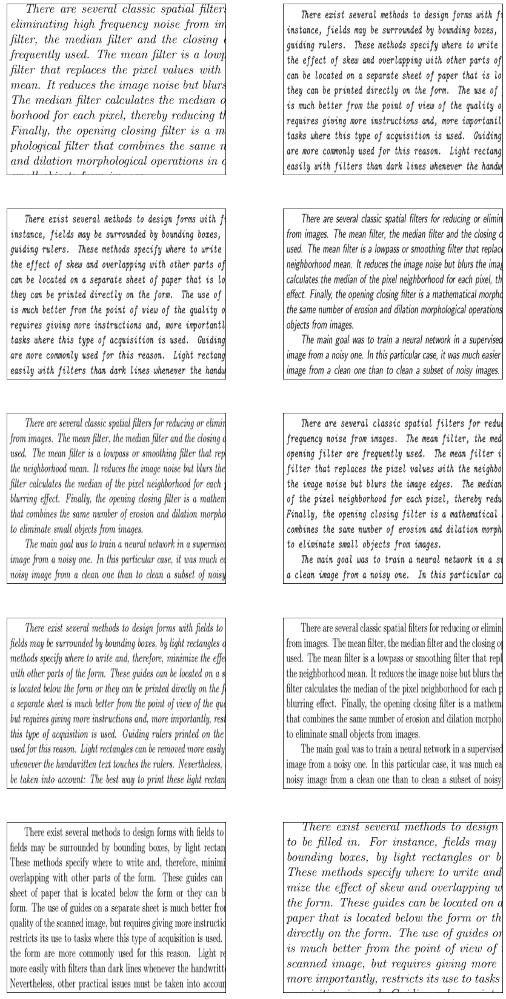

In [7]:
plt.figure(figsize=(15,30))
numero_muestras = 10
muestras = np.random.randint(0,len(train_cleaned), numero_muestras)

for i in range(numero_muestras):
    plt.subplot(5,2,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(train_cleaned[i][:,:,0], cmap='gray')

plt.show()

# Crear las imagenes con ruido 

In [8]:
# generar imagenes con ruido 
# Función para generar ruido 
def ruido(borrar):
    factor_ruido = 0.4
    array_ruido = borrar + factor_ruido * np.random.normal(
        loc = 0.0, scale = 1, size = borrar.shape
    )
    return np.clip(array_ruido, 0.0,1.0)

In [9]:
train_ruido = ruido(train_cleaned)

In [10]:
print(train_ruido.shape)
print(train_ruido.max())

(144, 420, 540, 1)
1.0


In [11]:
print(len(train_ruido))
print(len(train_cleaned))

144
144


# Mostrar las imagenes con ruido

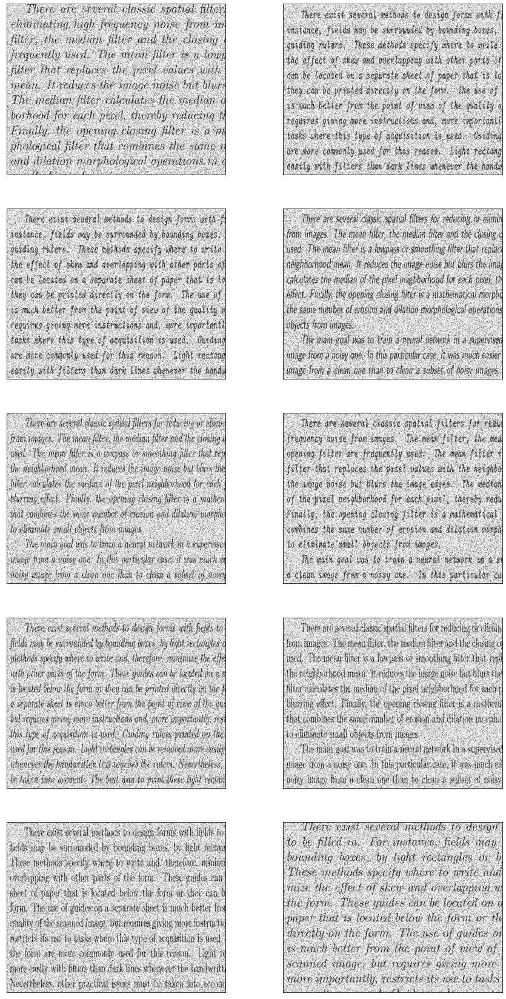

In [12]:
plt.figure(figsize=(15,30))
numero_muestras = 10
muestras = np.random.randint(0,len(train_ruido), numero_muestras)

for i in range(numero_muestras):
    plt.subplot(5,2,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(train_ruido[i][:,:,0], cmap='gray')

plt.show()

# Definir el modelo 

In [ ]:
'''inputs = layers.Input(shape=(ancho,alto, 1))
# Encoder
x = layers.Conv2D(32, (3,3), activation = 'relu', padding = 'same')(inputs)
x = layers.MaxPooling2D((2,2), padding = 'same')(x)
x = layers.Conv2D(32,(3,3), activation='relu', padding = 'same')(x)
#x = layers.MaxPooling2D((2,2), padding = 'same')(x)

# Decoder 
x = layers.Conv2DTranspose(32,(3,3), strides = 2, activation = 'relu', padding = 'same')(x)
#x = layers.MaxPooling2D((2,2), padding = 'same')(x)
x = layers.Conv2DTranspose(32,(3,3), activation = 'relu', padding = 'same')(x)
x = layers.Conv2D(1,(3,3), activation= 'sigmoid', padding = 'same')(x)


# Autoencoders
autoencoder = Model(inputs, x)
autoencoder.compile(optimizer='adam', loss='binary_crossentropy')

autoencoder.summary()
plot_model(autoencoder,show_shapes=True)'''

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 420, 540, 1)]     0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 420, 540, 32)      320       
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 210, 270, 32)      0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 210, 270, 32)      9248      
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 105, 135, 32)      0         
_________________________________________________________________
conv2d_transpose_2 (Conv2DTr (None, 210, 270, 32)      9248      
_________________________________________________________________
conv2d_transpose_3 (Conv2DTr (None, 420, 540, 32)      9248

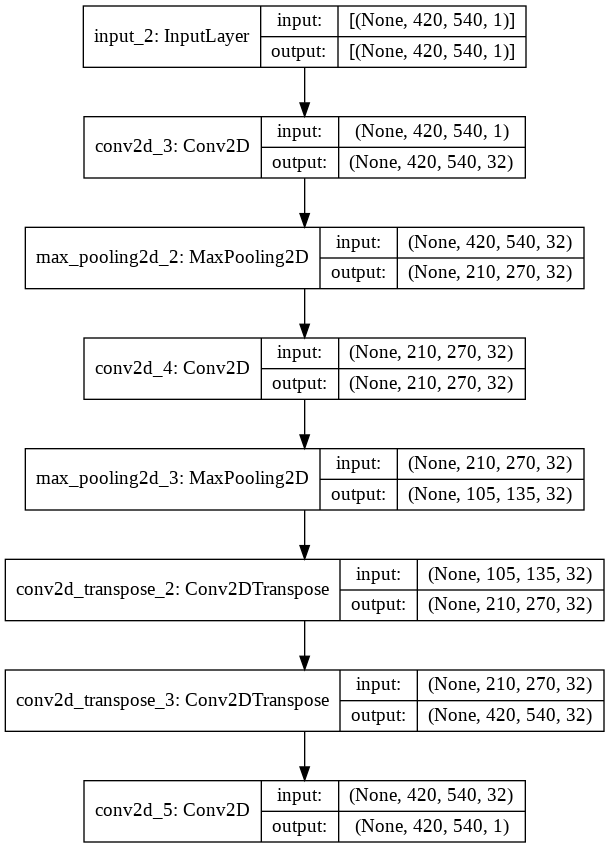

In [ ]:
inputs = layers.Input(shape=(alto , ancho, 1))

# Encoder
x = layers.Conv2D(32, (3, 3), activation="relu", padding="same")(inputs)
x = layers.MaxPooling2D((2, 2), padding="same")(x)
x = layers.Conv2D(32, (3, 3), activation="relu", padding="same")(x)
x = layers.MaxPooling2D((2, 2), padding="same")(x)

# Decoder
x = layers.Conv2DTranspose(32, (3, 3), strides=2, activation="relu", padding="same")(x)
x = layers.Conv2DTranspose(32, (3, 3), strides=2, activation="relu", padding="same")(x)
x = layers.Conv2D(1, (3, 3), activation="sigmoid", padding="same")(x)

# Autoencoder
autoencoder = Model(inputs, x)
autoencoder.compile(optimizer="adam", loss="binary_crossentropy", metrics=['accuracy'])
autoencoder.summary()
plot_model(autoencoder,show_shapes=True)

In [ ]:
X_train,X_test=train_test_split(train_cleaned,test_size=0.1, random_state=42)

# Entrenar Autoencoder

In [ ]:
history=autoencoder.fit(
    x=train_cleaned,
    y=train_cleaned,
    epochs=100,
    batch_size=6,
    shuffle=True,
     validation_data=(X_test, X_test))

Epoch 1/100
24/24 [==============================] - 96s 4s/step - loss: 0.5969 - accuracy: 0.5871 - val_loss: 0.3461 - val_accuracy: 0.6769
Epoch 2/100
24/24 [==============================] - 94s 4s/step - loss: 0.3442 - accuracy: 0.6593 - val_loss: 0.3302 - val_accuracy: 0.6769
Epoch 3/100
24/24 [==============================] - 102s 4s/step - loss: 0.3306 - accuracy: 0.6585 - val_loss: 0.2941 - val_accuracy: 0.6769
Epoch 4/100
24/24 [==============================] - 96s 4s/step - loss: 0.2726 - accuracy: 0.6678 - val_loss: 0.2270 - val_accuracy: 0.6769
Epoch 5/100
24/24 [==============================] - 95s 4s/step - loss: 0.2198 - accuracy: 0.6630 - val_loss: 0.2079 - val_accuracy: 0.6769
Epoch 6/100
24/24 [==============================] - 95s 4s/step - loss: 0.2018 - accuracy: 0.6698 - val_loss: 0.1921 - val_accuracy: 0.6801
Epoch 7/100
24/24 [==============================] - 95s 4s/step - loss: 0.1908 - accuracy: 0.6663 - val_loss: 0.1760 - val_accuracy: 0.6906
Epoch 8/100


## Guardar el modelo 

In [ ]:
path = './model_reconstruction'
if not os.path.exists(path):
    os.mkdir(path)
autoencoder.save('./model_reconstruction/model.h5')
autoencoder.save_weights('./model_reconstruction/pesos.h5')   

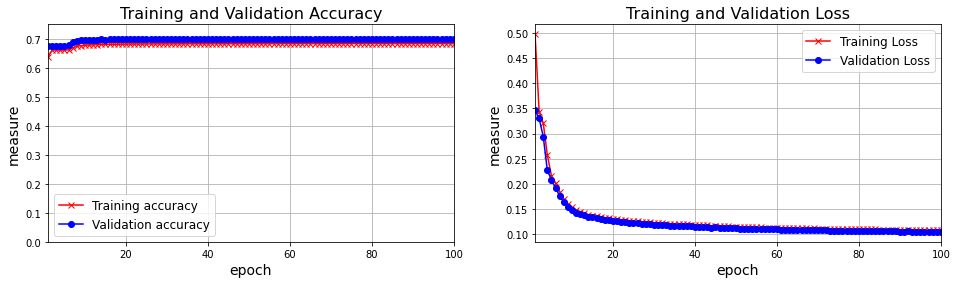

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1,len(acc)+1)

n_row = 1
n_col = 2
fig, ax = plt.subplots(n_row, n_col, sharex = False, sharey = False, figsize=(16,4))


ax[0].plot(epochs, acc, 'rx-', label='Training accuracy')
ax[0].plot(epochs, val_acc, 'bo-', label='Validation accuracy')
ax[0].legend(fontsize=12,loc=0)
ax[0].set_title('Training and Validation Accuracy',fontsize=16)
ax[0].set_ylabel('measure',fontsize=14)
ax[0].set_xlabel('epoch', fontsize = 14)
ax[0].set_ylim(0,0.75)
ax[0].grid()
ax[0].set_xlim([1, len(acc)])

ax[1].plot(epochs, loss, 'rx-', label='Training Loss')
ax[1].plot(epochs, val_loss, 'bo-', label='Validation Loss')
ax[1].legend(fontsize=12)
ax[1].set_title('Training and Validation Loss',fontsize=16)
ax[1].set_ylabel('measure',fontsize=14)
ax[1].set_xlabel('epoch', fontsize = 14)
ax[1].set_xlim([1, len(acc)])
ax[1].grid()

plt.show()

# Mostrar Recuperación

In [ ]:
predictions = autoencoder.predict(X_test)


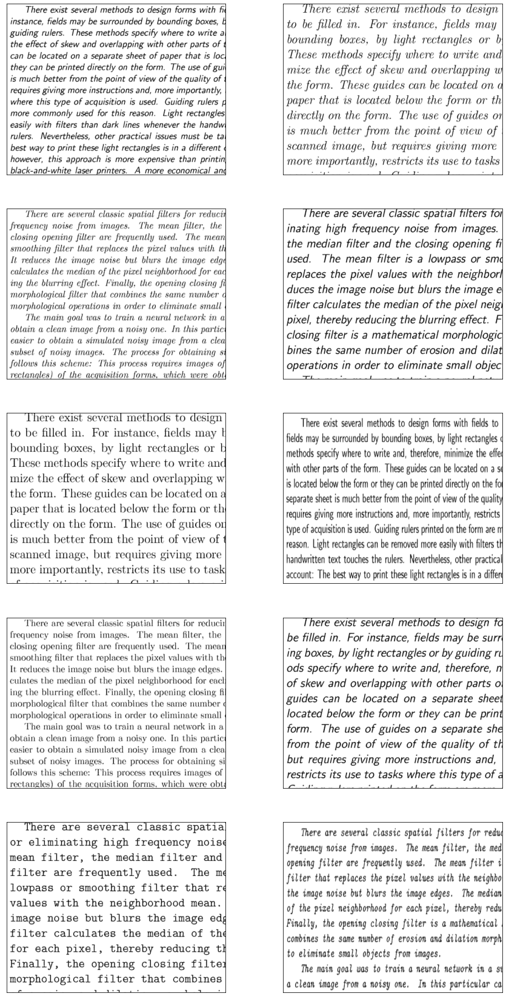

In [ ]:
plt.figure(figsize=(15,30))
numero_muestras = 10
muestras = np.random.randint(0,len(predictions), numero_muestras)

for i in range(numero_muestras):
    plt.subplot(5,2,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(predictions[i][:,:,0], cmap='gray')

plt.show()

# Entrenar Sobre imágenes a las que se les genero ruido

## Cargar modelo

In [16]:
from tensorflow.keras.models import load_model

In [17]:
autoencoder2 = '/content/drive/MyDrive/Ejercicios Diplo IA/model_reconstruction2/model2.h5'
pesoscoder2 = '/content/drive/MyDrive/Ejercicios Diplo IA/model_reconstruction2/pesos2.h5'

In [18]:
autoencoder2 = load_model(autoencoder2)
autoencoder2.load_weights(pesoscoder2)

In [ ]:
autoencoder2 = autoencoder

In [ ]:
autoencoder2.compile(optimizer="adam", loss="binary_crossentropy", metrics=['accuracy'])

# Entrenar el modelo para imagenes a las que se les genero ruido 

In [ ]:
history=autoencoder2.fit(
    x=train_ruido,
    y=train_cleaned,
    epochs=100,
    batch_size=6,
    shuffle=True,
    validation_data=(X_test, X_test))


 

Epoch 1/100
24/24 [==============================] - 98s 4s/step - loss: 0.1601 - accuracy: 0.6793 - val_loss: 0.1766 - val_accuracy: 0.6991
Epoch 2/100
24/24 [==============================] - 97s 4s/step - loss: 0.1543 - accuracy: 0.6800 - val_loss: 0.1542 - val_accuracy: 0.6998
Epoch 3/100
24/24 [==============================] - 97s 4s/step - loss: 0.1515 - accuracy: 0.6804 - val_loss: 0.1445 - val_accuracy: 0.7001
Epoch 4/100
24/24 [==============================] - 97s 4s/step - loss: 0.1496 - accuracy: 0.6806 - val_loss: 0.1322 - val_accuracy: 0.7004
Epoch 5/100
24/24 [==============================] - 97s 4s/step - loss: 0.1485 - accuracy: 0.6807 - val_loss: 0.1320 - val_accuracy: 0.7004
Epoch 6/100
24/24 [==============================] - 97s 4s/step - loss: 0.1472 - accuracy: 0.6809 - val_loss: 0.1345 - val_accuracy: 0.7004
Epoch 7/100
24/24 [==============================] - 96s 4s/step - loss: 0.1465 - accuracy: 0.6810 - val_loss: 0.1274 - val_accuracy: 0.7004
Epoch 8/100
2

In [ ]:
# Guardar el modelo 
path = './model_reconstruction2'
if not os.path.exists(path):
    os.mkdir(path)
autoencoder.save('./model_reconstruction2/model2.h5')
autoencoder.save_weights('./model_reconstruction2/pesos2.h5')

## Cargar el modelo

In [ ]:
from tensorflow.keras.models import load_model

In [ ]:
autoencoder2 = '/content/drive/MyDrive/Ejercicios Diplo IA/model_reconstruction2/model2.h5'
pesoscoder2 = '/content/drive/MyDrive/Ejercicios Diplo IA/model_reconstruction2/pesos2.h5'

In [ ]:
autoencoder2 = load_model(autoencoder2)
autoencoder2.load_weights(pesoscoder2)

# Predicciones con las imagenes generadas con ruido 

In [ ]:
predictions2 = autoencoder2.predict(train_ruido)


# Mostrar imagenes recuperadas con el autoencoder2

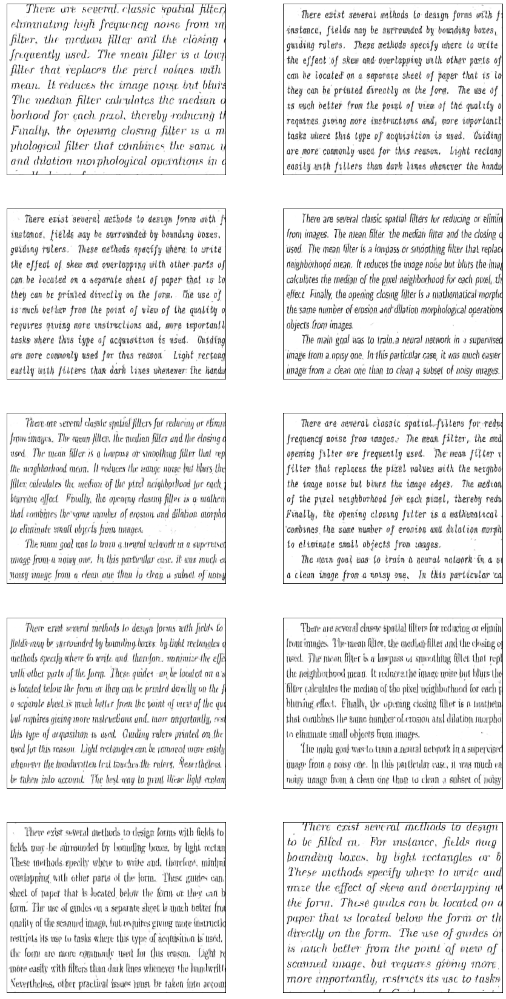

In [ ]:
plt.figure(figsize=(15,30))
numero_muestras = 10
muestras = np.random.randint(0,len(predictions2), numero_muestras)

for i in range(numero_muestras):
    plt.subplot(5,2,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(predictions2[i][:,:,0], cmap='gray')

plt.show()

# Recontrucción de un documento 

In [ ]:
import cv2
from PIL import Image

In [ ]:
from google.colab import files
imagesbn = files.upload()

Saving 142.png to 142.png


|

In [ ]:
imgtorecons = Image.open('/content/drive/MyDrive/Ejercicios Diplo IA/142.png')
imgtorecons = imgtorecons.convert('L')

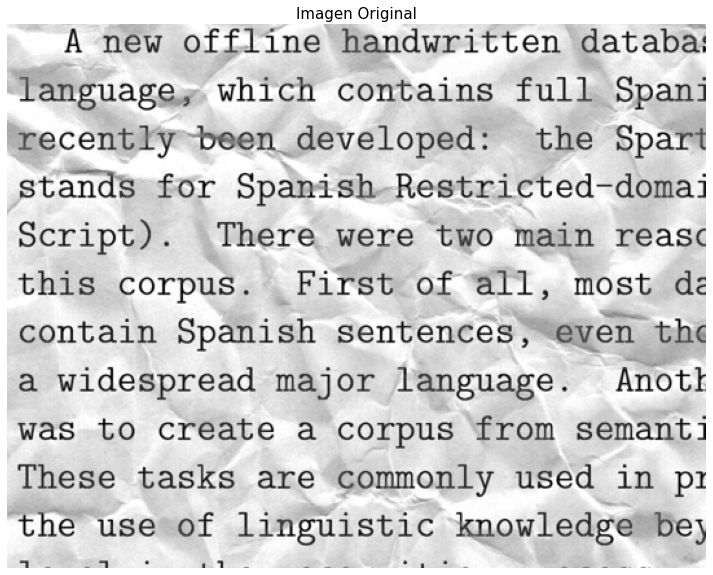

In [ ]:
plt.figure(figsize=(15,10))
plt.title('Imagen Original', fontsize = 15)
plt.imshow(imgtorecons, cmap='gray')

plt.axis('off')
plt.show()

# Normalizar el la imagen de entrada

In [ ]:
imgtorecons_norm = (np.array(imgtorecons))/255. 

print('La forma de la imagen reducida es:', imgtorecons_norm.shape)
imgtorecons_norm = cv2.resize(imgtorecons_norm,(420,540)).flatten()
print('Data flatten',imgtorecons_norm.shape)
imgtorecons_norm = np.array(imgtorecons_norm).reshape(1,420,540,1)
print('Nueva forma de los datos:', imgtorecons_norm.shape)

La forma de la imagen reducida es: (420, 540)
Data flatten (226800,)
Nueva forma de los datos: (1, 420, 540, 1)


In [ ]:
documento_reconstituido = autoencoder2.predict(imgtorecons_norm)

In [ ]:
print('la dimensión de la imagen es:', documento_reconstituido.shape)
print('', len(documento_reconstituido))

la dimensión de la imagen es: (1, 420, 540, 1)
 1


In [ ]:
img_rows = imgtorecons_norm.shape[1]
img_cols = imgtorecons_norm.shape[2]
channels = imgtorecons_norm.shape[3]

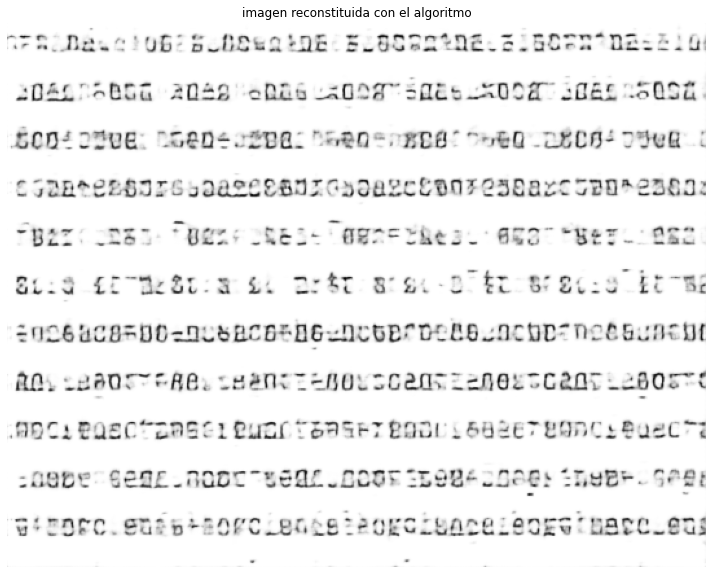

In [ ]:
imgs = documento_reconstituido
imgs = imgs.reshape((img_rows, img_cols, channels))
plt.figure(figsize=(15,10))
plt.title('imagen reconstituida con el algoritmo')
plt.imshow(imgs[:,:,0], cmap='gray')
plt.axis('off')
plt.show()

# [Entrenando con otro conjunto de datos tomados](https://www.kaggle.com/michalbrezk/denoise-images-using-autoencoders-tf-keras?select=sampleSubmission.csv.zip)

In [19]:

train  = '/content/drive/MyDrive/Ejercicios Diplo IA/train'
# test = '/content/drive/MyDrive/Ejercicios Diplo IA/test'

## Cargar los datos 

In [20]:
# Cargar imagenes limpias 
train_path = train
train = []
alto = 420
ancho = 540
 
for img in os.listdir(train_path):
    img = cv2.imread(os.path.join(train_path, img))
    
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img_resize = cv2.resize(img_gray,(540, 420))
    
    train.append(img_resize)

In [21]:
train= np.asarray(train, dtype='float32')/255.
train=np.expand_dims(train, axis=3)
print(train.shape)
print(train.max())

(144, 420, 540, 1)
1.0


# Mostrar imagenes

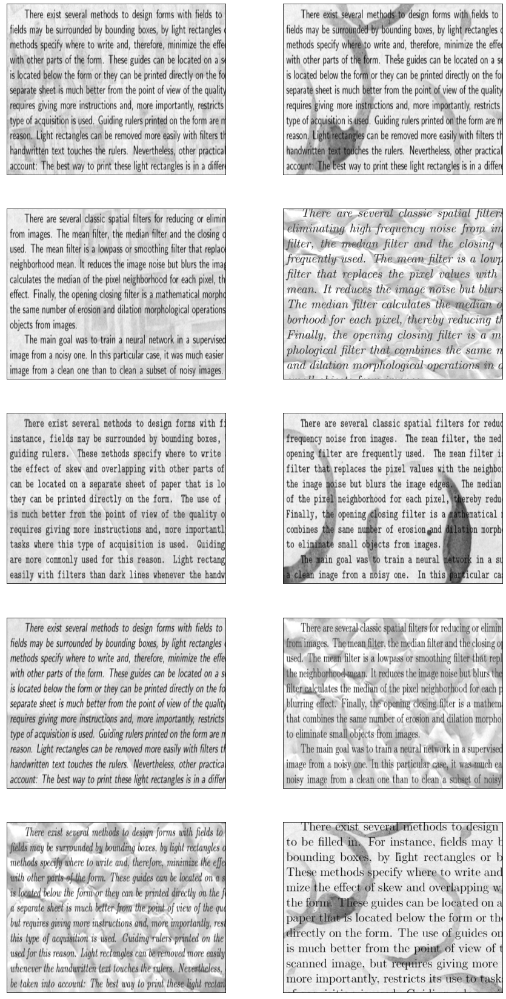

In [22]:
plt.figure(figsize=(15,30))
numero_muestras = 10
muestras = np.random.randint(0,len(train), numero_muestras)

for i in range(numero_muestras):
    plt.subplot(5,2,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(train[i][:,:,0], cmap='gray')

plt.show()

In [23]:

X_train, X_val, Y_train, Y_val = train_test_split(train, train_cleaned, test_size=0.15)

In [24]:
autoencoder3 = autoencoder2

In [28]:
#autoencoder3.compile(optimizer="adam", loss="binary_crossentropy", metrics=['accuracy'])
callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=30, min_delta=0.01)

In [29]:
history3=autoencoder3.fit(
    x=train,
    y=train_cleaned,
    epochs=200,
    batch_size=6,
    shuffle=True,
     validation_data=(X_val, Y_val),
     callbacks = [callback])



Epoch 1/200
24/24 [==============================] - 2s 82ms/step - loss: 0.3149 - accuracy: 0.6613 - val_loss: 0.3039 - val_accuracy: 0.6517
Epoch 2/200
24/24 [==============================] - 2s 80ms/step - loss: 0.3148 - accuracy: 0.6613 - val_loss: 0.3040 - val_accuracy: 0.6517
Epoch 3/200
24/24 [==============================] - 2s 81ms/step - loss: 0.3140 - accuracy: 0.6613 - val_loss: 0.3023 - val_accuracy: 0.6517
Epoch 4/200
24/24 [==============================] - 2s 81ms/step - loss: 0.3130 - accuracy: 0.6613 - val_loss: 0.3019 - val_accuracy: 0.6517
Epoch 5/200
24/24 [==============================] - 2s 81ms/step - loss: 0.3129 - accuracy: 0.6613 - val_loss: 0.3024 - val_accuracy: 0.6517
Epoch 6/200
24/24 [==============================] - 2s 83ms/step - loss: 0.3126 - accuracy: 0.6613 - val_loss: 0.3014 - val_accuracy: 0.6517
Epoch 7/200
24/24 [==============================] - 2s 82ms/step - loss: 0.3121 - accuracy: 0.6613 - val_loss: 0.3012 - val_accuracy: 0.6517
Epoch 

In [31]:
# Guardar el modelo 
path = './model_reconstruction3'
if not os.path.exists(path):
    os.mkdir(path)
autoencoder3.save('./model_reconstruction3/model3.h5')
autoencoder3.save_weights('./model_reconstruction3/pesos3.h5')

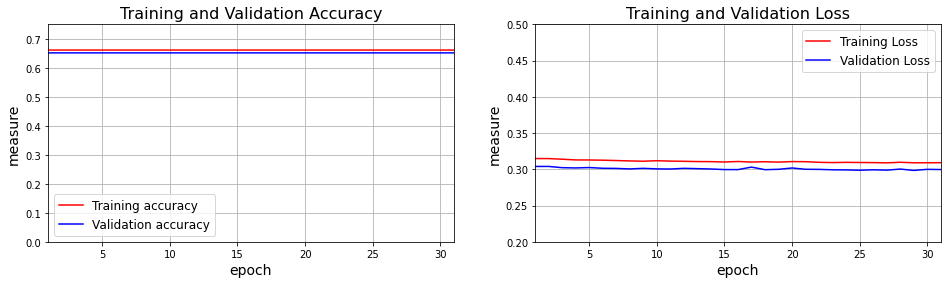

In [34]:
acc = history3.history['accuracy']
val_acc = history3.history['val_accuracy']
loss = history3.history['loss']
val_loss = history3.history['val_loss']

epochs = range(1,len(acc)+1)

n_row = 1
n_col = 2
fig, ax = plt.subplots(n_row, n_col, sharex = False, sharey = False, figsize=(16,4))


ax[0].plot(epochs, acc, 'r-', label='Training accuracy')
ax[0].plot(epochs, val_acc, 'b-', label='Validation accuracy')
ax[0].legend(fontsize=12,loc=0)
ax[0].set_title('Training and Validation Accuracy',fontsize=16)
ax[0].set_ylabel('measure',fontsize=14)
ax[0].set_xlabel('epoch', fontsize = 14)
ax[0].set_ylim(0,0.75)
ax[0].grid()
ax[0].set_xlim([1, len(acc)])

ax[1].plot(epochs, loss, 'r-', label='Training Loss')
ax[1].plot(epochs, val_loss, 'b-', label='Validation Loss')
ax[1].legend(fontsize=12)
ax[1].set_title('Training and Validation Loss',fontsize=16)
ax[1].set_ylabel('measure',fontsize=14)
ax[1].set_xlabel('epoch', fontsize = 14)
ax[1].set_ylim(0.2,0.5)
ax[1].set_xlim([1, len(acc)])
ax[1].grid()

plt.show()


In [35]:
predictions3 = autoencoder3.predict(train)

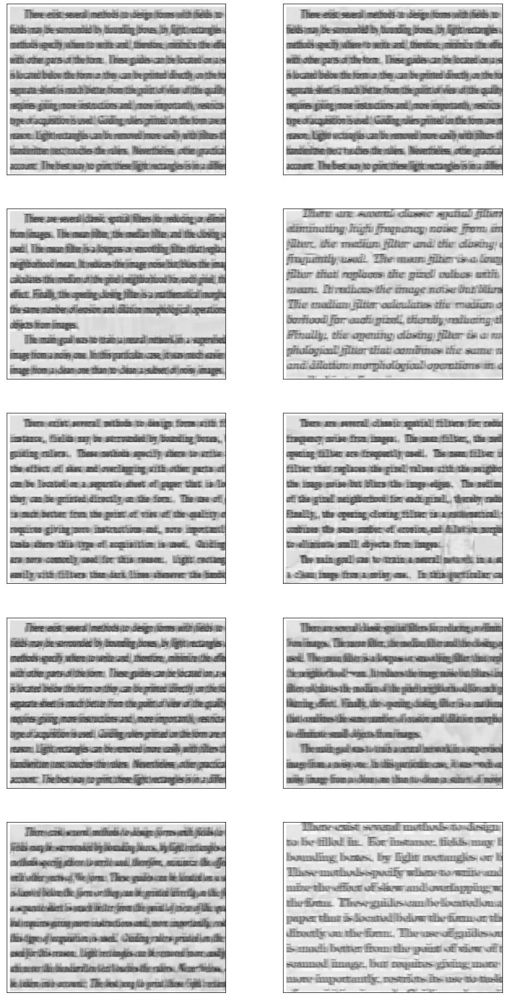

In [36]:
plt.figure(figsize=(15,30))
numero_muestras = 10
muestras = np.random.randint(0,len(predictions3), numero_muestras)

for i in range(numero_muestras):
    plt.subplot(5,2,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(predictions3[i][:,:,0], cmap='gray')

plt.show()

# Construcción de un modelo tomado de internet
## [Fuente Modelo hacke](https://www.kaggle.com/michalbrezk/denoise-images-using-autoencoders-tf-keras?select=sampleSubmission.csv.zip)

In [41]:
def model():
    input_layer = Input(shape=(420, 540, 1))  # we might define (None,None,1) here, but in model summary dims would not be visible
    
    # encoding
    x = Conv2D(64, (3, 3), activation='relu', padding='same')(input_layer)
    x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = BatchNormalization()(x)

    x = MaxPooling2D((2, 2), padding='same')(x)
    
    x = Dropout(0.5)(x)

    # decoding
    x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = BatchNormalization()(x)

    x = UpSampling2D((2, 2))(x)

    output_layer = Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)
    model = Model(inputs=[input_layer], outputs=[output_layer])
    model.compile(optimizer='adam' , loss='mean_squared_error', metrics=['accuracy'])

    return model


model = model()
model.summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 420, 540, 1)]     0         
_________________________________________________________________
conv2d_10 (Conv2D)           (None, 420, 540, 64)      640       
_________________________________________________________________
conv2d_11 (Conv2D)           (None, 420, 540, 128)     73856     
_________________________________________________________________
batch_normalization_4 (Batch (None, 420, 540, 128)     512       
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 210, 270, 128)     0         
_________________________________________________________________
dropout_2 (Dropout)          (None, 210, 270, 128)     0         
_________________________________________________________________
conv2d_12 (Conv2D)           (None, 210, 270, 128)     1475

In [42]:
callback = EarlyStopping(monitor='loss', patience=30)


In [43]:
history = model.fit(train, train_cleaned, 
                    validation_data =(X_val, Y_val),
                    epochs= 200, batch_size=6, 
                    verbose=1, callbacks=[callback])

Epoch 1/200
24/24 [==============================] - 9s 357ms/step - loss: 0.2134 - accuracy: 0.5033 - val_loss: 0.1131 - val_accuracy: 0.6517
Epoch 2/200
24/24 [==============================] - 8s 352ms/step - loss: 0.1055 - accuracy: 0.6273 - val_loss: 0.0698 - val_accuracy: 0.6517
Epoch 3/200
24/24 [==============================] - 8s 353ms/step - loss: 0.0872 - accuracy: 0.6515 - val_loss: 0.0648 - val_accuracy: 0.6517
Epoch 4/200
24/24 [==============================] - 8s 354ms/step - loss: 0.0748 - accuracy: 0.6509 - val_loss: 0.0662 - val_accuracy: 0.6517
Epoch 5/200
24/24 [==============================] - 8s 355ms/step - loss: 0.0687 - accuracy: 0.6638 - val_loss: 0.0706 - val_accuracy: 0.6517
Epoch 6/200
24/24 [==============================] - 9s 357ms/step - loss: 0.0629 - accuracy: 0.6646 - val_loss: 0.0719 - val_accuracy: 0.6517
Epoch 7/200
24/24 [==============================] - 9s 359ms/step - loss: 0.0629 - accuracy: 0.6621 - val_loss: 0.0717 - val_accuracy: 0.6517

In [44]:
# Guardar el modelo 
path = './model_modelohack'
if not os.path.exists(path):
    os.mkdir(path)
model.save('./model_modelohack/modelhack.h5')
model.save_weights('./model_modelohack/hack.h5')

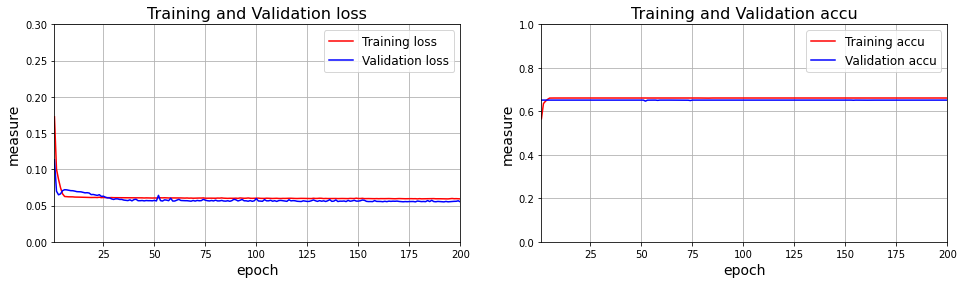

In [48]:
loss = history.history['loss']
val_loss = history.history['val_loss']
accu = history.history['accuracy']
val_accu = history.history['val_accuracy']

epochs = range(1,len(loss)+1)

n_row = 1
n_col = 2
fig, ax = plt.subplots(n_row, n_col, sharex = False, sharey = False, figsize=(16,4))


ax[0].plot(epochs, loss, 'r-', label='Training loss')
ax[0].plot(epochs, val_loss, 'b-', label='Validation loss')
ax[0].legend(fontsize=12,loc=0)
ax[0].set_title('Training and Validation loss',fontsize=16)
ax[0].set_ylabel('measure',fontsize=14)
ax[0].set_xlabel('epoch', fontsize = 14)
ax[0].set_ylim(0,0.3)
ax[0].grid()
ax[0].set_xlim([1, len(loss)])

ax[1].plot(epochs, accu, 'r-', label='Training accu')
ax[1].plot(epochs, val_accu, 'b-', label='Validation accu')
ax[1].legend(fontsize=12)
ax[1].set_title('Training and Validation accu',fontsize=16)
ax[1].set_ylabel('measure',fontsize=14)
ax[1].set_xlabel('epoch', fontsize = 14)
ax[1].set_ylim([0,1])
ax[1].set_xlim([1, len(loss)])
ax[1].grid()

plt.show()

In [49]:
model_predict = model.predict(train)

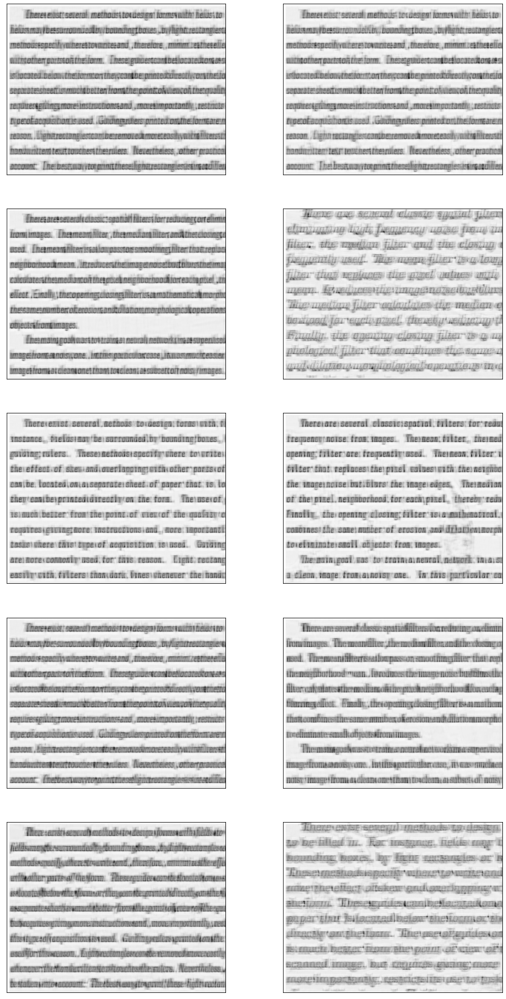

In [50]:
plt.figure(figsize=(15,30))
numero_muestras = 10
muestras = np.random.randint(0,len(model_predict), numero_muestras)

for i in range(numero_muestras):
    plt.subplot(5,2,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(model_predict[i][:,:,0], cmap='gray')

plt.show()

# Prediccion de lo las imagenes generadas con ruido con el modelo HACK

In [51]:
model_train_ruido_predict = model.predict(train_ruido)

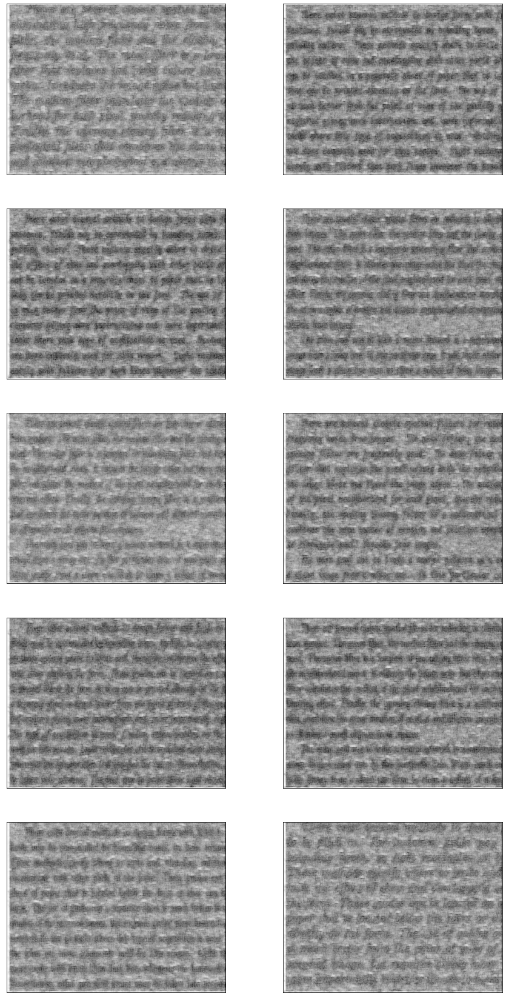

In [52]:
plt.figure(figsize=(15,30))
numero_muestras = 10
muestras = np.random.randint(0,len(model_train_ruido_predict), numero_muestras)

for i in range(numero_muestras):
    plt.subplot(5,2,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(model_train_ruido_predict[i][:,:,0], cmap='gray')

plt.show()

# Predecir la imagen problema con el modelo hack

In [53]:
import cv2
from PIL import Image

In [ ]:
from google.colab import files
imagesbn = files.upload()

Saving 142.png to 142.png


In [54]:
imgtorecons = Image.open('/content/drive/MyDrive/Ejercicios Diplo IA/142.png')
imgtorecons = imgtorecons.convert('L')

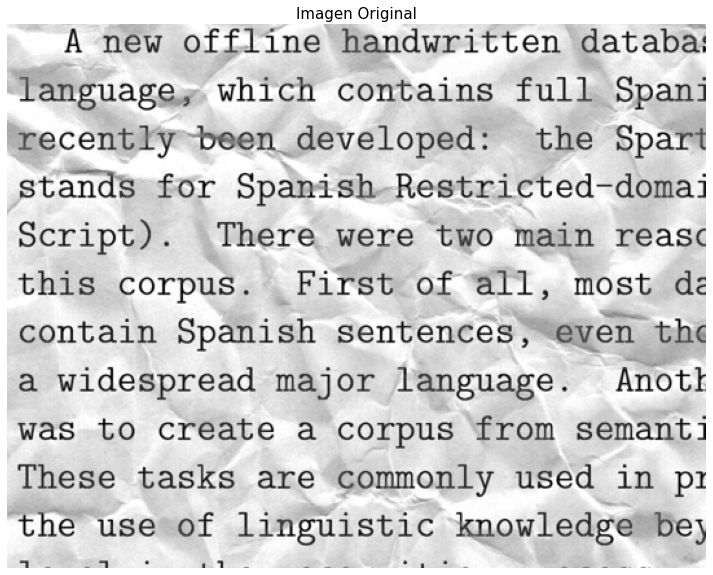

In [55]:
plt.figure(figsize=(15,10))
plt.title('Imagen Original', fontsize = 15)
plt.imshow(imgtorecons, cmap='gray')

plt.axis('off')
plt.show()

In [56]:
imgtorecons_norm = (np.array(imgtorecons))/255. 

print('La forma de la imagen reducida es:', imgtorecons_norm.shape)
imgtorecons_norm = cv2.resize(imgtorecons_norm,(420,540)).flatten()
print('Data flatten',imgtorecons_norm.shape)
imgtorecons_norm = np.array(imgtorecons_norm).reshape(1,420,540,1)
print('Nueva forma de los datos:', imgtorecons_norm.shape)

La forma de la imagen reducida es: (420, 540)
Data flatten (226800,)
Nueva forma de los datos: (1, 420, 540, 1)


In [57]:
documento_reconstituido = model.predict(imgtorecons_norm)

In [58]:
print('la dimensión de la imagen es:', documento_reconstituido.shape)
print('', len(documento_reconstituido))

la dimensión de la imagen es: (1, 420, 540, 1)
 1


In [59]:
img_rows = imgtorecons_norm.shape[1]
img_cols = imgtorecons_norm.shape[2]
channels = imgtorecons_norm.shape[3]

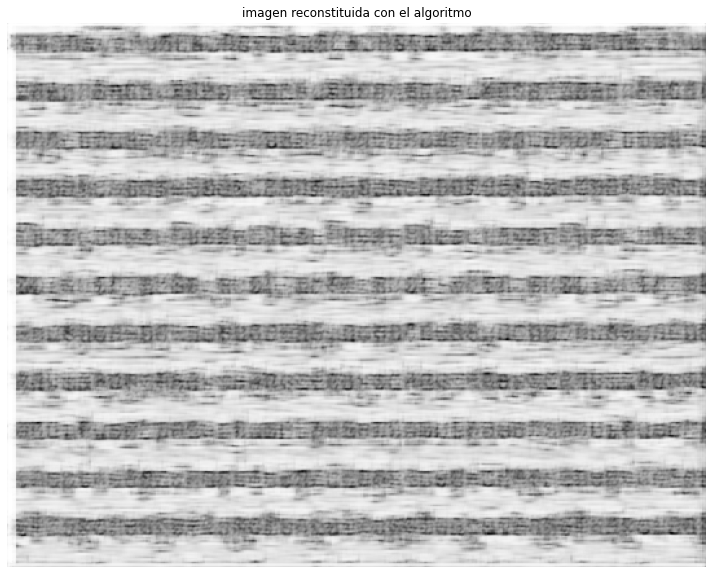

In [60]:
imgs = documento_reconstituido
imgs = imgs.reshape((img_rows, img_cols, channels))
plt.figure(figsize=(15,10))
plt.title('imagen reconstituida con el algoritmo')
plt.imshow(imgs[:,:,0], cmap='gray')
plt.axis('off')
plt.show()